<h1> AutoEncoder on Supervised Pretraining (4-way classification) </h1> 

In [1]:
DEBUG = False

# Imports & Load Data

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os
import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2
%matplotlib inline

sns.set()
sns.set_palette('bwr')
SNS_CMAP = 'bwr'
plt.style.use("dark_background")
plt.rcParams['grid.color'] = '#444444'
colors = sns.palettes.color_palette(SNS_CMAP)
pd.options.mode.chained_assignment = None

def clrd(text: str, color: str = None, con: bool = None, c1:str = 'ok', c2:str = 'error')->str:
    text = str(text)
    color_codes = {
        'ok': '\033[1;92m',
        'error': '\033[91m',
        'warning': '\033[93m',
        'success': '\033[92m',
        'status': '\033[95m',
        'special': '\033[94m',
        'log': '\033[96m',
        'reset': '\033[0m',
    }
    if con is not None:
        color = c1 if con else c2
    color_code = color_codes.get(color, color_codes['reset'])
    return f"{color_code}{text}{color_codes['reset']}"

In [3]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, ConcatDataset

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset, TensorDataset
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
!pip install -q graphviz torchsummary torchview

from torchsummary import summary
import torchvision
from torchview import draw_graph

In [5]:
import cv2
import os
from pathlib import Path
from PIL import Image
from termcolor import colored
import glob
from typing import List, Tuple
from sklearn.metrics import f1_score, accuracy_score
from tqdm.notebook import tqdm

# 1. Supervised PreTraining on Encoder

## 1.1 Load Classification Data

In [6]:
DATA_DIR = r"/kaggle/input/chest-ctscan-images/Data"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")
VAL_DIR = os.path.join(DATA_DIR, "valid")

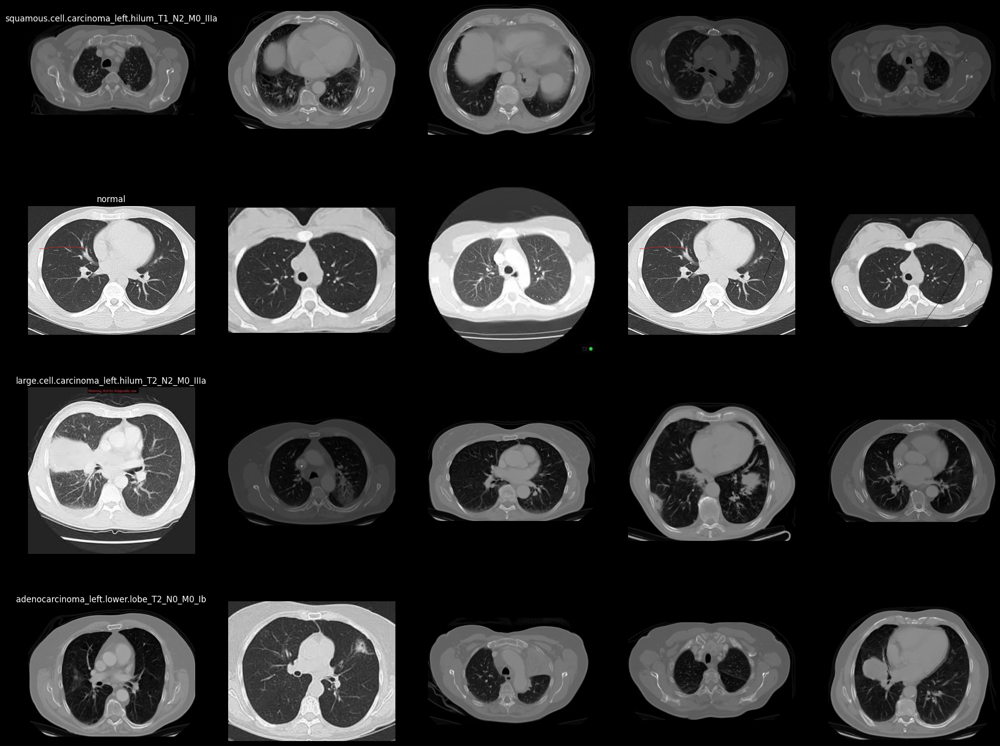

In [7]:
def visualize_multiclass_from_dir(data_dir: str, samples:int = 5)->None:
  """
  Visualizes a random sample of images from multiple classes stored in directories.

  Parameters:
    data_dir (str): The root directory containing subdirectories for each class, where each subdirectory contains images for that class.
    samples (int, optional) :  The number of images to randomly sample and display from each class.

  Returns:
  None

  Displays a grid of images with one row per class and one column per sample.
  Note: This function is intended for multiclass datasets organized with a separate folder for each class.
  """
  classes = os.listdir(data_dir)
  fig, ax = plt.subplots(len(classes), samples, figsize=(5*samples, 5*len(classes)))
  for i, cls in enumerate(classes):
    cls_dir = os.path.join(data_dir, cls)
    img_paths = os.listdir(cls_dir)
    for j in range(samples):
      idx = np.random.randint(0, len(img_paths))
      img_path = os.path.join(cls_dir, img_paths[idx])
      img = cv2.imread(img_path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      ax[i, j].imshow(img)
      ax[i, j].axis('off')
    ax[i, 0].set_title(cls)
  # plt.tight_layout()
  plt.show()


visualize_multiclass_from_dir(data_dir=TRAIN_DIR)

In [8]:
LABEL_MAP = {
    "adenocarcinoma": 0,
    "adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib": 0,
    "large.cell.carcinoma": 1,
    "large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa": 1,
    "large.cell.carcinoma": 1,
    "normal": 2,
    "squamous.cell.carcinoma": 3,
    "squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa": 3
}

train_paths, train_labels = [], []
val_paths, val_labels = [], []

for split in ['train', 'test', 'valid']:
    split_path = os.path.join(DATA_DIR, split)
    for folder in os.listdir(split_path):
        full_path = os.path.join(split_path, folder)
        if not os.path.isdir(full_path):
            continue
        label = LABEL_MAP.get(folder)
        if label is None:
            print(f"Unknown folder label: {folder}")
            continue
        for fname in os.listdir(full_path):
            if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(full_path, fname)
                if split == 'valid':
                    val_paths.append(img_path)
                    val_labels.append(label)
                else:
                    train_paths.append(img_path)
                    train_labels.append(label)

df_train = pd.DataFrame({
    "img": train_paths,
    "label": train_labels
})
df_valid = pd.DataFrame({
    "img": val_paths,
    "label": val_labels
})
df_train.shape, df_valid.shape

((928, 2), (72, 2))

In [9]:
class ImageDatasetCSV(Dataset):
    def __init__(self, df, transform=None):
        """
        Args:
            df (pd.DataFrame): `img` and `label` columns.
            transform (callable, optional): Optional transforms to apply to the images.
        """
        self.df = df.copy()
        df['label'] = df['label'].apply(lambda y: torch.tensor(y, dtype=torch.long)) 
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['img']).convert("RGB")
        label = row['label']

        if self.transform:
            image = self.transform(image)

        return image, label

## 1.2 Augmentations

Using mostly noise and brightness augs here ... not going for any spatial transforms atleast for now

In [10]:
train_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.RandomAffine(
        degrees=10,              # small rotation
        translate=(0.05, 0.05),  # simulate slight offset
        scale=(0.95, 1.05),      # simulate zoom in/out
        shear=5                  # optional shear
    ),
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2)
    ], p=0.8),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.1), ratio=(0.3, 3.3)),
    transforms.Normalize(mean=[0.5], std=[0.5])
])


val_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

In [11]:
train_dataset = ImageDatasetCSV(df_train, train_transforms)
val_dataset = ImageDatasetCSV(df_valid, val_transforms)

## 1.3 Classification Head on Encoder

In [12]:
#=============================   ENCODER   ===============================================
#=========================================================================================
class Encoder(nn.Module):
    
    #========== RESIDUALBLOCK =============
    class ResidualBlock(nn.Module):
        def __init__(self, in_channels, out_channels, dropout_prob=0.0):
            super(Encoder.ResidualBlock, self).__init__()
            self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1)
            self.bn1 = nn.BatchNorm2d(out_channels)
            self.act1 = nn.LeakyReLU(0.2)
        
            self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
            self.bn2 = nn.BatchNorm2d(out_channels)
            self.dropout = nn.Dropout2d(p=dropout_prob) if dropout_prob > 0 else nn.Identity()
            self.act2 = nn.LeakyReLU(0.2)
        
            self.skip = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=2)
        
        def forward(self, x):
            identity = self.skip(x)
            x = self.act1(self.bn1(self.conv1(x)))
            x = self.dropout(self.bn2(self.conv2(x)))
            x += identity
            return self.act2(x)
    #======== END OF RESIDUALBLOCK =========
    
    def __init__(self, in_channels=1, base_dim=32, latent_dim=512, dropout_prob=0.1):
        super(Encoder, self).__init__()
        self.dropout_prob = dropout_prob
        self.latent_dim = latent_dim
        self.base_dim = base_dim
        
        self.encoder_blocks = nn.Sequential(
            Encoder.ResidualBlock(in_channels, base_dim, dropout_prob=dropout_prob),
            Encoder.ResidualBlock(base_dim, base_dim * 2, dropout_prob=dropout_prob),
            Encoder.ResidualBlock(base_dim * 2, base_dim * 4, dropout_prob=dropout_prob),
            Encoder.ResidualBlock(base_dim * 4, base_dim * 8, dropout_prob=dropout_prob),
        )
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(base_dim * 8, latent_dim)

    def forward(self, x):
        x = self.encoder_blocks(x)
        x = self.global_pool(x).view(x.size(0), -1)
        z = self.fc(x)
        return z

    def disable_dropout(self):
        for m in self.modules():
            if isinstance(m, nn.Dropout) or isinstance(m, nn.Dropout2d):
                m.p = 0.0
                m.__class__ = nn.Identity

encoder = Encoder()
encoder.to(device)
summary(encoder, (1,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]              64
            Conv2d-2         [-1, 32, 128, 128]             320
       BatchNorm2d-3         [-1, 32, 128, 128]              64
         LeakyReLU-4         [-1, 32, 128, 128]               0
            Conv2d-5         [-1, 32, 128, 128]           9,248
       BatchNorm2d-6         [-1, 32, 128, 128]              64
         Dropout2d-7         [-1, 32, 128, 128]               0
         LeakyReLU-8         [-1, 32, 128, 128]               0
     ResidualBlock-9         [-1, 32, 128, 128]               0
           Conv2d-10           [-1, 64, 64, 64]           2,112
           Conv2d-11           [-1, 64, 64, 64]          18,496
      BatchNorm2d-12           [-1, 64, 64, 64]             128
        LeakyReLU-13           [-1, 64, 64, 64]               0
           Conv2d-14           [-1, 64,

In [13]:
#=============================   CLASSIFIER   ============================================
#=========================================================================================

class Classifier(nn.Module):
    """
    This is a multiclass-classification head fitted on the encoder for the `chest-ctscan-images` data

    After pretraining and loading model weights, we can extract encoder as
    ```
    model = Classifier(in_channels=1, num_classes=4, dropout=0.3)
    encoder = model.encoder
    ```
    """
    def __init__(self, encoder: nn.Module, latent_dim: int, num_classes: int):
        super(Classifier, self).__init__()
        self.encoder = encoder
        self.classifier = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        latent = self.encoder(x)
        y = self.classifier(latent)
        return y

model = Classifier(encoder, encoder.latent_dim, num_classes=4).to(device)

## 1.4 Training

In [14]:
epochs = 100
batch_size = 64
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_workers = 2
num_gpu = 2
base_lr = 1e-3
save_dir = r"/kaggle/working/"

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [15]:
model = model.to(device)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=base_lr)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.9)

if torch.cuda.device_count() > 1 and num_gpu > 1:
    model = nn.DataParallel(model)
    print(f"Using {torch.cuda.device_count()} gpu!")

Using 2 gpu!


In [16]:
def get_accuracy_and_f1(y, yhat):
    y_pred = torch.argmax(yhat, dim=1)
    y_true_np = y.cpu().numpy()
    y_pred_np = y_pred.cpu().numpy()
    f1 = f1_score(y_true_np, y_pred_np, average='weighted')
    acc = accuracy_score(y_true_np, y_pred_np)
    return acc, f1

def debug_grad_norm(model):
    try:
        total_grad_norm = 0.0
        for param in model.parameters():
            if param.grad is not None:
                total_grad_norm += param.grad.data.norm(2).item() ** 2
        return total_grad_norm
    except Exception as e:
        if DEBUG:
            raise e
        return -69

In [17]:
history = {
    "train_acc": [],
    "train_loss": [],
    "val_acc": [],
    "val_loss": []
}
    
for epoch in range(epochs):
    train_loss, train_acc = 0.0, []
    model.train()
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")
    for batch in pbar:
        optimizer.zero_grad()
        images, y = batch
        images, y = images.to(device), y.to(device)
        yhat = model(images)
        
        loss = criterion(yhat, y)
        loss.backward()
        optimizer.step()

        acc, f1 = get_accuracy_and_f1(y, yhat)
        train_loss +=  loss.item()/len(batch[0])
        train_acc.append(acc)

    scheduler.step()
    history["train_loss"].append(train_loss)
    history["train_acc"].append(np.mean(train_acc))
    
    model.eval()
    val_loss, val_accs = 0.0, []
    with torch.no_grad():
      for batch in val_loader:
        images, y = batch
        images, y = images.to(device), y.to(device)
        yhat = model(images)
        loss = criterion(yhat, y)
        acc, f1 = get_accuracy_and_f1(y, yhat)

        val_loss += loss.item() / len(batch[0])
        val_accs.append(acc)
      
    history["val_loss"].append(val_loss)
    history["val_acc"].append(np.mean(val_accs))
    classifier_grad_norm = debug_grad_norm(model.module.encoder)
    
    print_val = f"{clrd('train_Loss:', 'special')} {train_loss:.5f}   "
    print_val += f"{clrd('val_loss:', 'status')} {val_loss:.5f}   "
    print_val += f"{clrd('acc_t:', 'special')} {np.mean(train_acc):.5f}   "
    print_val += f"{clrd('acc_v:', 'status')} {np.mean(val_accs):.5f}   "
    print_val += f"{clrd('grad:', 'ok')} {classifier_grad_norm:.5f}   "
    print(print_val)
    if DEBUG:
        break


Epoch 1/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.29942   val_loss: 0.15757   acc_t: 0.43438   acc_v: 0.18750   grad: 2.20204   


Epoch 2/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.26846   val_loss: 0.13524   acc_t: 0.50521   acc_v: 0.50781   grad: 2.47626   


Epoch 3/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.25566   val_loss: 0.15884   acc_t: 0.52292   acc_v: 0.18750   grad: 0.72511   


Epoch 4/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.27229   val_loss: 0.20524   acc_t: 0.48646   acc_v: 0.20312   grad: 2.11225   


Epoch 5/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.25287   val_loss: 0.13179   acc_t: 0.51667   acc_v: 0.46875   grad: 0.79593   


Epoch 6/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.24940   val_loss: 0.13519   acc_t: 0.50521   acc_v: 0.66406   grad: 0.82619   


Epoch 7/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23886   val_loss: 0.12721   acc_t: 0.55104   acc_v: 0.46094   grad: 1.58187   


Epoch 8/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23887   val_loss: 0.13620   acc_t: 0.53854   acc_v: 0.53125   grad: 0.76206   


Epoch 9/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.24560   val_loss: 0.16590   acc_t: 0.54479   acc_v: 0.31250   grad: 0.39062   


Epoch 10/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.24216   val_loss: 0.16646   acc_t: 0.53542   acc_v: 0.25781   grad: 0.32486   


Epoch 11/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.24397   val_loss: 0.17904   acc_t: 0.53646   acc_v: 0.21094   grad: 0.58362   


Epoch 12/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.24518   val_loss: 0.12464   acc_t: 0.51979   acc_v: 0.58594   grad: 0.84074   


Epoch 13/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23814   val_loss: 0.13437   acc_t: 0.55417   acc_v: 0.65625   grad: 2.67927   


Epoch 14/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23187   val_loss: 0.12213   acc_t: 0.58958   acc_v: 0.52344   grad: 2.15993   


Epoch 15/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23927   val_loss: 0.19014   acc_t: 0.55729   acc_v: 0.32031   grad: 1.51816   


Epoch 16/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23667   val_loss: 0.14873   acc_t: 0.58229   acc_v: 0.60156   grad: 0.97156   


Epoch 17/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22775   val_loss: 0.17843   acc_t: 0.58437   acc_v: 0.25000   grad: 0.26345   


Epoch 18/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22225   val_loss: 0.13389   acc_t: 0.58437   acc_v: 0.46875   grad: 1.14451   


Epoch 19/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22280   val_loss: 0.16176   acc_t: 0.56563   acc_v: 0.48438   grad: 0.75878   


Epoch 20/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23708   val_loss: 0.15991   acc_t: 0.56979   acc_v: 0.45312   grad: 1.08740   


Epoch 21/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22251   val_loss: 0.13128   acc_t: 0.56250   acc_v: 0.49219   grad: 0.11617   


Epoch 22/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23388   val_loss: 0.13946   acc_t: 0.56979   acc_v: 0.50781   grad: 2.53321   


Epoch 23/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21076   val_loss: 0.16355   acc_t: 0.60417   acc_v: 0.40625   grad: 2.03049   


Epoch 24/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22873   val_loss: 0.14961   acc_t: 0.58854   acc_v: 0.37500   grad: 9.34716   


Epoch 25/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.23299   val_loss: 0.14842   acc_t: 0.56042   acc_v: 0.48438   grad: 1.02558   


Epoch 26/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22458   val_loss: 0.12026   acc_t: 0.57708   acc_v: 0.47656   grad: 0.48046   


Epoch 27/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.22045   val_loss: 0.17188   acc_t: 0.58854   acc_v: 0.36719   grad: 0.38434   


Epoch 28/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21803   val_loss: 0.18365   acc_t: 0.59479   acc_v: 0.35156   grad: 2.06578   


Epoch 29/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21899   val_loss: 0.16072   acc_t: 0.58958   acc_v: 0.37500   grad: 0.72625   


Epoch 30/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21896   val_loss: 0.12792   acc_t: 0.60104   acc_v: 0.48438   grad: 1.41047   


Epoch 31/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21938   val_loss: 0.12802   acc_t: 0.61250   acc_v: 0.47656   grad: 0.91188   


Epoch 32/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21389   val_loss: 0.12173   acc_t: 0.62396   acc_v: 0.57031   grad: 0.84544   


Epoch 33/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21360   val_loss: 0.13802   acc_t: 0.61979   acc_v: 0.52344   grad: 1.28952   


Epoch 34/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21748   val_loss: 0.15382   acc_t: 0.60104   acc_v: 0.34375   grad: 0.63327   


Epoch 35/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21758   val_loss: 0.14712   acc_t: 0.58125   acc_v: 0.50000   grad: 0.50026   


Epoch 36/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20986   val_loss: 0.14534   acc_t: 0.61458   acc_v: 0.60938   grad: 0.74085   


Epoch 37/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20782   val_loss: 0.14292   acc_t: 0.64167   acc_v: 0.54688   grad: 1.84459   


Epoch 38/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20625   val_loss: 0.13047   acc_t: 0.63021   acc_v: 0.57812   grad: 0.49989   


Epoch 39/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21383   val_loss: 0.09770   acc_t: 0.63229   acc_v: 0.64062   grad: 7.04161   


Epoch 40/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20327   val_loss: 0.17371   acc_t: 0.62917   acc_v: 0.42969   grad: 1.97478   


Epoch 41/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20720   val_loss: 0.17654   acc_t: 0.64062   acc_v: 0.36719   grad: 1.93743   


Epoch 42/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20453   val_loss: 0.13211   acc_t: 0.65625   acc_v: 0.53906   grad: 1.36660   


Epoch 43/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20169   val_loss: 0.14454   acc_t: 0.65521   acc_v: 0.60938   grad: 1.66700   


Epoch 44/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20851   val_loss: 0.15307   acc_t: 0.63125   acc_v: 0.49219   grad: 1.75044   


Epoch 45/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.19801   val_loss: 0.18318   acc_t: 0.65312   acc_v: 0.39062   grad: 0.97741   


Epoch 46/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20575   val_loss: 0.09761   acc_t: 0.64271   acc_v: 0.65625   grad: 0.70943   


Epoch 47/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.21211   val_loss: 0.12609   acc_t: 0.61979   acc_v: 0.45312   grad: 1.92328   


Epoch 48/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.19365   val_loss: 0.11202   acc_t: 0.66354   acc_v: 0.60938   grad: 5.14443   


Epoch 49/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20705   val_loss: 0.19585   acc_t: 0.64271   acc_v: 0.30469   grad: 2.12587   


Epoch 50/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.19440   val_loss: 0.10394   acc_t: 0.67188   acc_v: 0.65625   grad: 2.96971   


Epoch 51/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.19190   val_loss: 0.08249   acc_t: 0.67917   acc_v: 0.60156   grad: 5.45347   


Epoch 52/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18218   val_loss: 0.10875   acc_t: 0.68021   acc_v: 0.57031   grad: 3.59872   


Epoch 53/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18390   val_loss: 0.22282   acc_t: 0.68750   acc_v: 0.44531   grad: 2.71087   


Epoch 54/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18855   val_loss: 0.12221   acc_t: 0.68854   acc_v: 0.58594   grad: 2.51765   


Epoch 55/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18124   val_loss: 0.13896   acc_t: 0.70521   acc_v: 0.51562   grad: 1.90095   


Epoch 56/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18144   val_loss: 0.09324   acc_t: 0.67917   acc_v: 0.57812   grad: 1.52093   


Epoch 57/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18543   val_loss: 0.17522   acc_t: 0.70312   acc_v: 0.41406   grad: 12.47982   


Epoch 58/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.20666   val_loss: 0.12536   acc_t: 0.64271   acc_v: 0.63281   grad: 5.78052   


Epoch 59/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18649   val_loss: 0.15849   acc_t: 0.66771   acc_v: 0.50000   grad: 0.54681   


Epoch 60/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18605   val_loss: 0.13742   acc_t: 0.69271   acc_v: 0.51562   grad: 1.84545   


Epoch 61/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.17308   val_loss: 0.11575   acc_t: 0.70729   acc_v: 0.66406   grad: 1.75165   


Epoch 62/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18055   val_loss: 0.08395   acc_t: 0.69271   acc_v: 0.66406   grad: 2.19739   


Epoch 63/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.17041   val_loss: 0.12362   acc_t: 0.70937   acc_v: 0.57812   grad: 3.78930   


Epoch 64/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.18080   val_loss: 0.17871   acc_t: 0.68125   acc_v: 0.49219   grad: 8.70813   


Epoch 65/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.17922   val_loss: 0.13726   acc_t: 0.71458   acc_v: 0.45312   grad: 1.26990   


Epoch 66/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16758   val_loss: 0.10211   acc_t: 0.72813   acc_v: 0.56250   grad: 4.49211   


Epoch 67/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16667   val_loss: 0.11891   acc_t: 0.72188   acc_v: 0.58594   grad: 6.18341   


Epoch 68/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16804   val_loss: 0.10150   acc_t: 0.71771   acc_v: 0.64844   grad: 12.56681   


Epoch 69/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16947   val_loss: 0.13502   acc_t: 0.73125   acc_v: 0.64844   grad: 1.99668   


Epoch 70/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15841   val_loss: 0.09666   acc_t: 0.74687   acc_v: 0.70312   grad: 1.35367   


Epoch 71/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15456   val_loss: 0.10039   acc_t: 0.75000   acc_v: 0.63281   grad: 1.99674   


Epoch 72/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15541   val_loss: 0.14166   acc_t: 0.75000   acc_v: 0.75000   grad: 2.38675   


Epoch 73/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16280   val_loss: 0.08147   acc_t: 0.74375   acc_v: 0.66406   grad: 9.42175   


Epoch 74/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.17233   val_loss: 0.06676   acc_t: 0.73854   acc_v: 0.69531   grad: 4.15170   


Epoch 75/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16210   val_loss: 0.10931   acc_t: 0.71979   acc_v: 0.71094   grad: 4.41783   


Epoch 76/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.16096   val_loss: 0.15800   acc_t: 0.73333   acc_v: 0.42969   grad: 8.23204   


Epoch 77/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15919   val_loss: 0.16651   acc_t: 0.73125   acc_v: 0.46875   grad: 7.23864   


Epoch 78/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15669   val_loss: 0.11437   acc_t: 0.74271   acc_v: 0.50000   grad: 17.21354   


Epoch 79/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15360   val_loss: 0.11507   acc_t: 0.74687   acc_v: 0.71094   grad: 3.14713   


Epoch 80/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.14542   val_loss: 0.11501   acc_t: 0.74583   acc_v: 0.68750   grad: 11.13452   


Epoch 81/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.14331   val_loss: 0.14411   acc_t: 0.78333   acc_v: 0.64062   grad: 23.00646   


Epoch 82/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.15316   val_loss: 0.07651   acc_t: 0.75313   acc_v: 0.68750   grad: 5.71249   


Epoch 83/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13519   val_loss: 0.07884   acc_t: 0.78542   acc_v: 0.75781   grad: 3.13803   


Epoch 84/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13562   val_loss: 0.16989   acc_t: 0.78125   acc_v: 0.58594   grad: 4.00407   


Epoch 85/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13976   val_loss: 0.08883   acc_t: 0.77396   acc_v: 0.64844   grad: 4.56956   


Epoch 86/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.14859   val_loss: 0.07078   acc_t: 0.75833   acc_v: 0.64844   grad: 22.21912   


Epoch 87/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.12520   val_loss: 0.05564   acc_t: 0.79792   acc_v: 0.71094   grad: 4.55311   


Epoch 88/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13697   val_loss: 0.10251   acc_t: 0.78750   acc_v: 0.59375   grad: 16.23637   


Epoch 89/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13207   val_loss: 0.07452   acc_t: 0.78854   acc_v: 0.69531   grad: 8.49382   


Epoch 90/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13576   val_loss: 0.10743   acc_t: 0.77917   acc_v: 0.60938   grad: 9.12878   


Epoch 91/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13230   val_loss: 0.06540   acc_t: 0.78958   acc_v: 0.64844   grad: 20.48144   


Epoch 92/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13918   val_loss: 0.05352   acc_t: 0.77500   acc_v: 0.76562   grad: 9.54085   


Epoch 93/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13408   val_loss: 0.04417   acc_t: 0.78438   acc_v: 0.69531   grad: 25.97896   


Epoch 94/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13756   val_loss: 0.14539   acc_t: 0.78125   acc_v: 0.57812   grad: 22.61869   


Epoch 95/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.13479   val_loss: 0.08356   acc_t: 0.78333   acc_v: 0.74219   grad: 2.42405   


Epoch 96/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.12741   val_loss: 0.05166   acc_t: 0.80625   acc_v: 0.67188   grad: 2.54705   


Epoch 97/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.12789   val_loss: 0.20130   acc_t: 0.81042   acc_v: 0.42188   grad: 14.32366   


Epoch 98/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.11698   val_loss: 0.07388   acc_t: 0.82188   acc_v: 0.72656   grad: 30.94979   


Epoch 99/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.11410   val_loss: 0.06604   acc_t: 0.82500   acc_v: 0.71875   grad: 8.02255   


Epoch 100/100:   0%|          | 0/15 [00:00<?, ?it/s]

train_Loss: 0.12037   val_loss: 0.07708   acc_t: 0.81354   acc_v: 0.71875   grad: 9.65230   


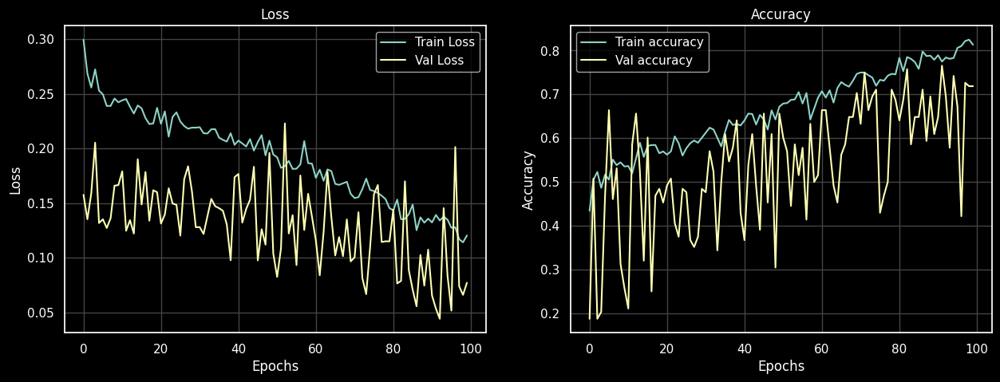

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(history["train_loss"], label="Train Loss")
ax[0].plot(history["val_loss"], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss")
ax[0].legend()

ax[1].plot(history["train_acc"], label="Train accuracy")
ax[1].plot(history["val_acc"], label="Val accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")
ax[1].set_title("Accuracy")
ax[1].legend()

plt.show()

In [19]:
torch.save(model.state_dict(), os.path.join(save_dir, f"classifier_4_5_25.pt"))

# 2. Training AutoEncoder

## 2.1 Load Data

In [20]:
class MedicalImageDatasetBlackWhite(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (str): Path to folder containing images.
            transform (callable, optional): Transform to apply to images.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)

        if self.transform:
            image = self.transform(image)

        return image

In [21]:
image_size = 256
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset = MedicalImageDatasetBlackWhite(root_dir='/kaggle/input/gan-train-data/ImageCLEF25_GAN_Detect_Training_Data_Usage_training-dataset/generated',
                              transform=transforms.Compose([
                               transforms.Grayscale(),
                               transforms.Resize((image_size, image_size)),
                               transforms.ToTensor(),
                               transforms.Normalize(mean=[0.5], std=[0.5]),
                           ]))

## 2.2 AutoEncoder

In [22]:
#=============================   DECODER   ===============================================
#=========================================================================================
class Decoder(nn.Module):

    #========== RESIDUALBLOCK =============
    class ResidualBlock(nn.Module):
        def __init__(self, in_filters, out_filters, dropout=0.0):
            super(Decoder.ResidualBlock, self).__init__()
            self.conv_trans = nn.ConvTranspose2d(in_filters, out_filters, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.conv1 = nn.Conv2d(out_filters, out_filters, kernel_size=3, padding=1)
            self.bn1 = nn.BatchNorm2d(out_filters)
            self.act1 = nn.LeakyReLU(0.1)
            self.conv2 = nn.Conv2d(out_filters, out_filters, kernel_size=3, padding=1)
            self.bn2 = nn.BatchNorm2d(out_filters)
            self.dropout = nn.Dropout2d(p=dropout)
            self.act2 = nn.LeakyReLU(0.1)

        def forward(self, x):
            x = self.conv_trans(x)
            identity = x
            out = self.act1(self.bn1(self.conv1(x)))
            out = self.dropout(self.bn2(self.conv2(out)))
            out += identity
            return self.act2(out)
    #========== END OF RESIDUALBLOCK =============

    def __init__(self, latent_dim=512, out_channels=1, dropout=0.0):
        super(Decoder, self).__init__()
        self.latent_dim = latent_dim
        
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256 * 8 * 8),
            nn.ReLU(),
            nn.Unflatten(1, (256, 8, 8)),

            self.ResidualBlock(256, 128, dropout=dropout),
            self.ResidualBlock(128, 128, dropout=dropout),
            self.ResidualBlock(128, 64, dropout=dropout),
            self.ResidualBlock(64, 32, dropout=dropout),

            nn.ConvTranspose2d(32, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Tanh()  # Because our image values are scaled between [-1, 1]
            ### don't use sigmoid here !!!
        )

    def forward(self, z):
        return self.decoder(z)

decoder = Decoder()
decoder = decoder.to(device)

In [23]:
#=============================   AutoEncoder   ===========================================
#=========================================================================================
class AutoEncoder(nn.Module):
    def __init__(self, encoder: nn.Module, decoder: nn.Module):
        super(AutoEncoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        z = self.encoder(x)
        recon = self.decoder(z)
        return recon

encoder.disable_dropout()
encoder.train()
auto_encoder = AutoEncoder(encoder, decoder)
auto_encoder.to(device)
summary(auto_encoder, (1,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]              64
            Conv2d-2         [-1, 32, 128, 128]             320
       BatchNorm2d-3         [-1, 32, 128, 128]              64
         LeakyReLU-4         [-1, 32, 128, 128]               0
            Conv2d-5         [-1, 32, 128, 128]           9,248
       BatchNorm2d-6         [-1, 32, 128, 128]              64
          Identity-7         [-1, 32, 128, 128]               0
         LeakyReLU-8         [-1, 32, 128, 128]               0
     ResidualBlock-9         [-1, 32, 128, 128]               0
           Conv2d-10           [-1, 64, 64, 64]           2,112
           Conv2d-11           [-1, 64, 64, 64]          18,496
      BatchNorm2d-12           [-1, 64, 64, 64]             128
        LeakyReLU-13           [-1, 64, 64, 64]               0
           Conv2d-14           [-1, 64,

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have rmm-cu12 25.2.0 which is incompatible.


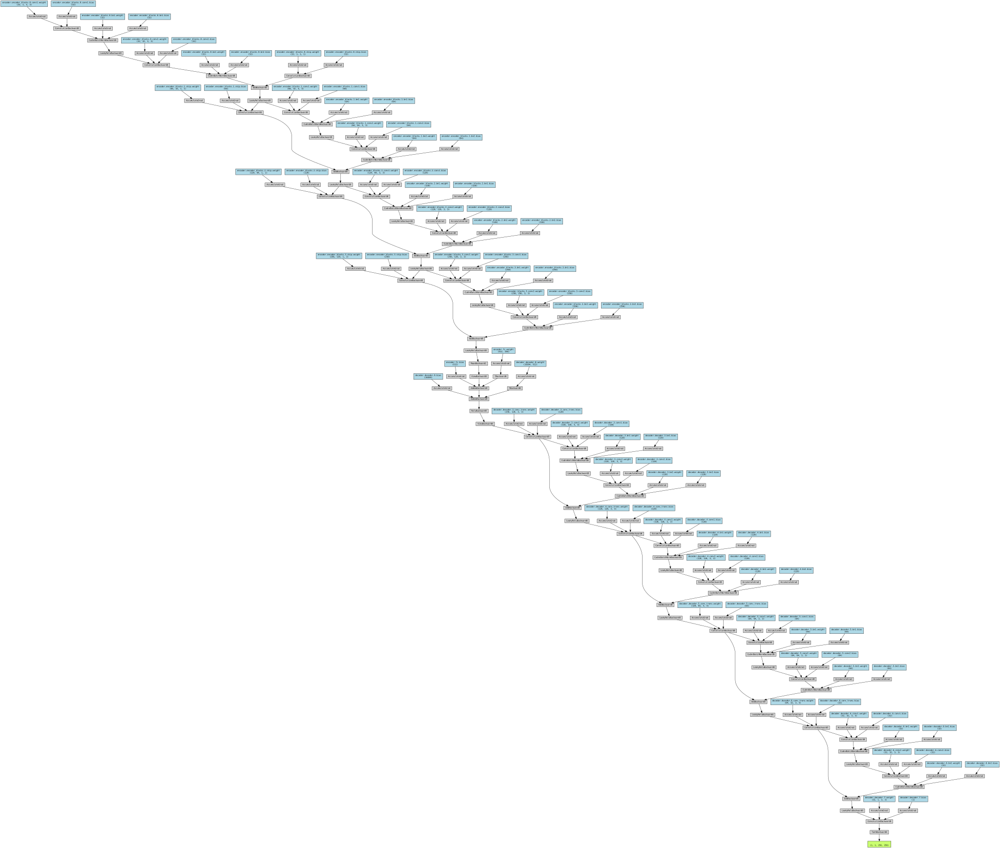

In [24]:
!pip install -q torchviz
from torchviz import make_dot
from IPython.display import display

x_in = torch.randn(1, 1, 256, 256).to(device)
yhat = auto_encoder(x_in)
dot = make_dot(yhat, params=dict(list(auto_encoder.named_parameters())))
display(dot)

## 2.3 Train

In [25]:
epochs = 100
batch_size = 64
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_workers = 2
num_gpu = 2
base_lr = 1e-3
save_dir = r"/kaggle/working/"

In [26]:
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

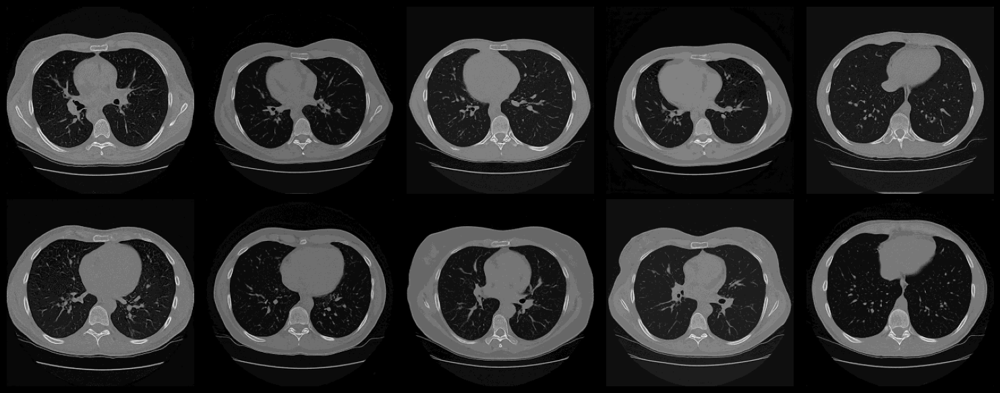

In [27]:
def show_tensor_images(images, rows:int = 2, cols:int = 5):
    images = images.detach().cpu()
    fig, ax = plt.subplots(rows, cols, figsize=(15, 3*rows))
    for i, img in enumerate(images[:cols*rows]):
        ax.flatten()[i].imshow(img.squeeze(), cmap="gray")
        ax.flatten()[i].axis('off')

    plt.tight_layout()
    plt.show()

sample_img_batch = None
for images in dataloader:
    sample_img_batch = images.clone().detach()
    break

sample_img_batch = sample_img_batch.to(device)
show_tensor_images(sample_img_batch)

In [28]:
criterion = nn.L1Loss()
optimizer = torch.optim.Adam(auto_encoder.parameters(), lr=base_lr)

if torch.cuda.device_count() > 1 and num_gpu > 1:
    auto_encoder = nn.DataParallel(auto_encoder)
    print(f"Using {torch.cuda.device_count()} gpu!")

Using 2 gpu!


Epoch 1/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.21809   grad_norm(encoder): 0.00049   grad_norm(decoder): 0.14008


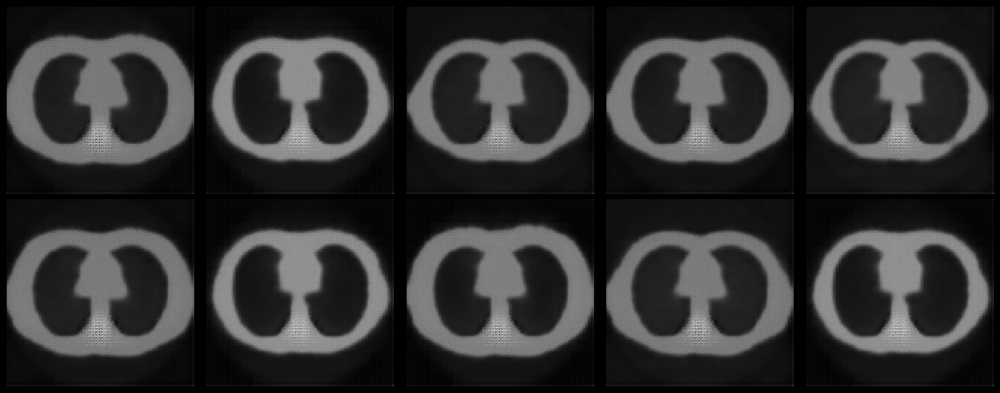

Epoch 2/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.12187   grad_norm(encoder): 0.00178   grad_norm(decoder): 0.08404


Epoch 3/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.10142   grad_norm(encoder): 0.00594   grad_norm(decoder): 0.10200


Epoch 4/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.09239   grad_norm(encoder): 0.00312   grad_norm(decoder): 0.14615


Epoch 5/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.08521   grad_norm(encoder): 0.00253   grad_norm(decoder): 0.04451


Epoch 6/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.08034   grad_norm(encoder): 0.00582   grad_norm(decoder): 0.15795


Epoch 7/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.07856   grad_norm(encoder): 0.00121   grad_norm(decoder): 0.06657


Epoch 8/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.07608   grad_norm(encoder): 0.00447   grad_norm(decoder): 0.11813


Epoch 9/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.07343   grad_norm(encoder): 0.00150   grad_norm(decoder): 0.15053


Epoch 10/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.07115   grad_norm(encoder): 0.00426   grad_norm(decoder): 0.06814


Epoch 11/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.07010   grad_norm(encoder): 0.00609   grad_norm(decoder): 0.21681


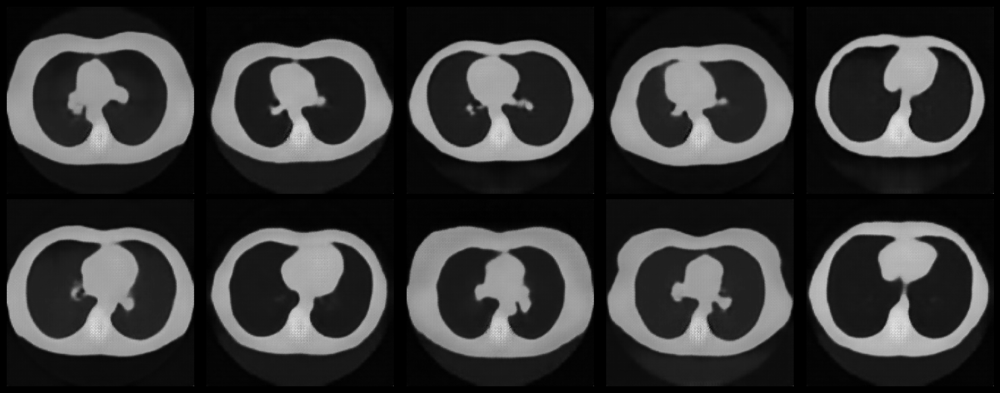

Epoch 12/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06946   grad_norm(encoder): 0.00224   grad_norm(decoder): 0.12703


Epoch 13/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06813   grad_norm(encoder): 0.00374   grad_norm(decoder): 0.16604


Epoch 14/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06619   grad_norm(encoder): 0.00597   grad_norm(decoder): 0.02373


Epoch 15/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06641   grad_norm(encoder): 0.00301   grad_norm(decoder): 0.03807


Epoch 16/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06571   grad_norm(encoder): 0.00571   grad_norm(decoder): 0.05609


Epoch 17/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06404   grad_norm(encoder): 0.00292   grad_norm(decoder): 0.02917


Epoch 18/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06476   grad_norm(encoder): 0.00668   grad_norm(decoder): 0.23049


Epoch 19/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06230   grad_norm(encoder): 0.00387   grad_norm(decoder): 0.16129


Epoch 20/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06254   grad_norm(encoder): 0.00401   grad_norm(decoder): 0.10961


Epoch 21/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06196   grad_norm(encoder): 0.00466   grad_norm(decoder): 0.21311


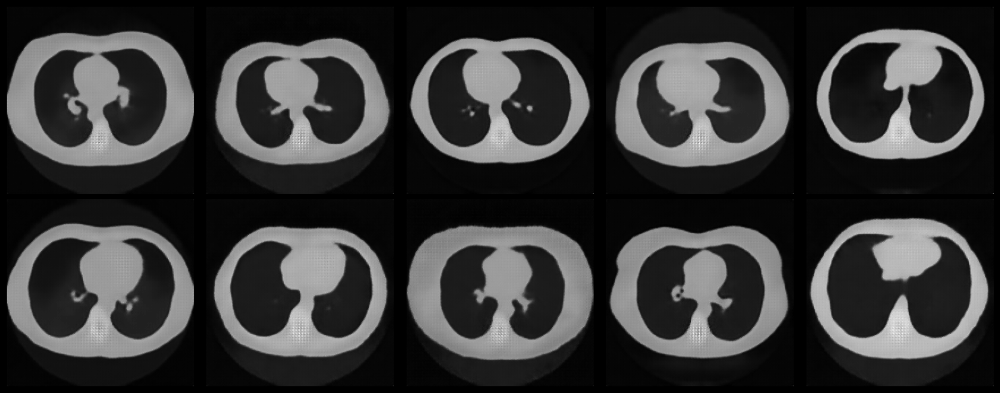

Epoch 22/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06122   grad_norm(encoder): 0.00395   grad_norm(decoder): 0.02682


Epoch 23/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05956   grad_norm(encoder): 0.00179   grad_norm(decoder): 0.03322


Epoch 24/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06039   grad_norm(encoder): 0.00357   grad_norm(decoder): 0.05030


Epoch 25/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.06028   grad_norm(encoder): 0.00618   grad_norm(decoder): 0.13463


Epoch 26/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05889   grad_norm(encoder): 0.00403   grad_norm(decoder): 0.03871


Epoch 27/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05936   grad_norm(encoder): 0.00237   grad_norm(decoder): 0.08104


Epoch 28/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05752   grad_norm(encoder): 0.00117   grad_norm(decoder): 0.09433


Epoch 29/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05769   grad_norm(encoder): 0.00380   grad_norm(decoder): 0.00862


Epoch 30/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05737   grad_norm(encoder): 0.00322   grad_norm(decoder): 0.02218


Epoch 31/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05688   grad_norm(encoder): 0.00290   grad_norm(decoder): 0.02009


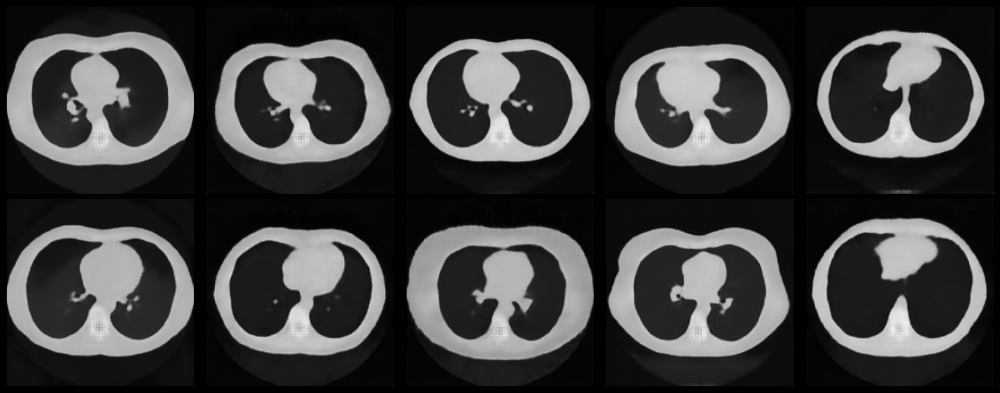

Epoch 32/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05712   grad_norm(encoder): 0.00422   grad_norm(decoder): 0.22369


Epoch 33/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05661   grad_norm(encoder): 0.00346   grad_norm(decoder): 0.04106


Epoch 34/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05551   grad_norm(encoder): 0.00525   grad_norm(decoder): 0.02970


Epoch 35/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05574   grad_norm(encoder): 0.00480   grad_norm(decoder): 0.04588


Epoch 36/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05716   grad_norm(encoder): 0.00393   grad_norm(decoder): 0.07772


Epoch 37/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05470   grad_norm(encoder): 0.00906   grad_norm(decoder): 0.01085


Epoch 38/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05535   grad_norm(encoder): 0.00276   grad_norm(decoder): 0.03956


Epoch 39/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05370   grad_norm(encoder): 0.00194   grad_norm(decoder): 0.02646


Epoch 40/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05328   grad_norm(encoder): 0.00383   grad_norm(decoder): 0.02159


Epoch 41/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05331   grad_norm(encoder): 0.00172   grad_norm(decoder): 0.07031


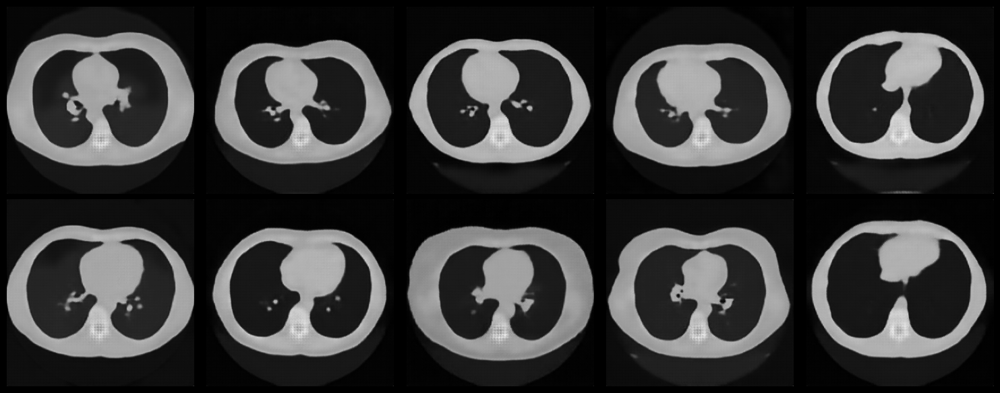

Epoch 42/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05366   grad_norm(encoder): 0.00476   grad_norm(decoder): 0.02253


Epoch 43/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05312   grad_norm(encoder): 0.00269   grad_norm(decoder): 0.02916


Epoch 44/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05312   grad_norm(encoder): 0.00252   grad_norm(decoder): 0.05336


Epoch 45/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05304   grad_norm(encoder): 0.00465   grad_norm(decoder): 0.05026


Epoch 46/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05271   grad_norm(encoder): 0.00290   grad_norm(decoder): 0.02398


Epoch 47/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05213   grad_norm(encoder): 0.00320   grad_norm(decoder): 0.03807


Epoch 48/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05231   grad_norm(encoder): 0.00259   grad_norm(decoder): 0.02282


Epoch 49/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05192   grad_norm(encoder): 0.00361   grad_norm(decoder): 0.09129


Epoch 50/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05149   grad_norm(encoder): 0.00254   grad_norm(decoder): 0.08259


Epoch 51/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05113   grad_norm(encoder): 0.00393   grad_norm(decoder): 0.12484


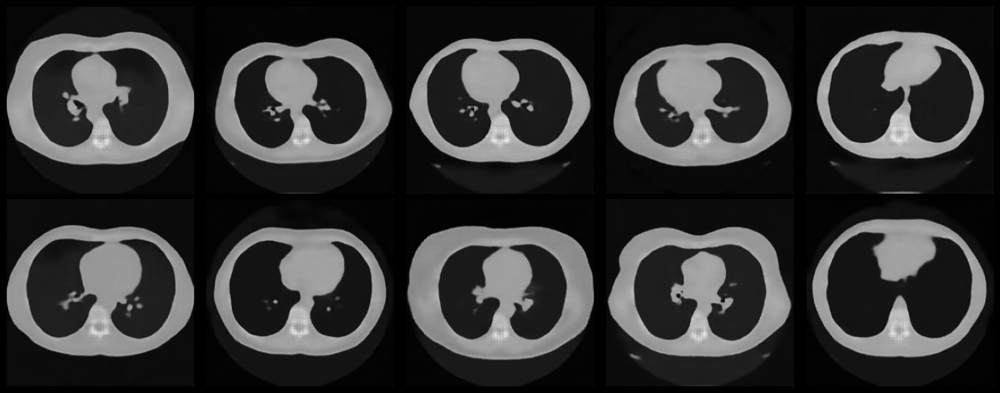

Epoch 52/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05185   grad_norm(encoder): 0.00365   grad_norm(decoder): 0.02407


Epoch 53/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05071   grad_norm(encoder): 0.00334   grad_norm(decoder): 0.11398


Epoch 54/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05122   grad_norm(encoder): 0.00534   grad_norm(decoder): 0.01699


Epoch 55/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05094   grad_norm(encoder): 0.00241   grad_norm(decoder): 0.07033


Epoch 56/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05012   grad_norm(encoder): 0.00801   grad_norm(decoder): 0.02050


Epoch 57/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05040   grad_norm(encoder): 0.00374   grad_norm(decoder): 0.00957


Epoch 58/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04983   grad_norm(encoder): 0.00608   grad_norm(decoder): 0.09008


Epoch 59/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05005   grad_norm(encoder): 0.00272   grad_norm(decoder): 0.03678


Epoch 60/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.05034   grad_norm(encoder): 0.00721   grad_norm(decoder): 0.03860


Epoch 61/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04932   grad_norm(encoder): 0.00295   grad_norm(decoder): 0.09675


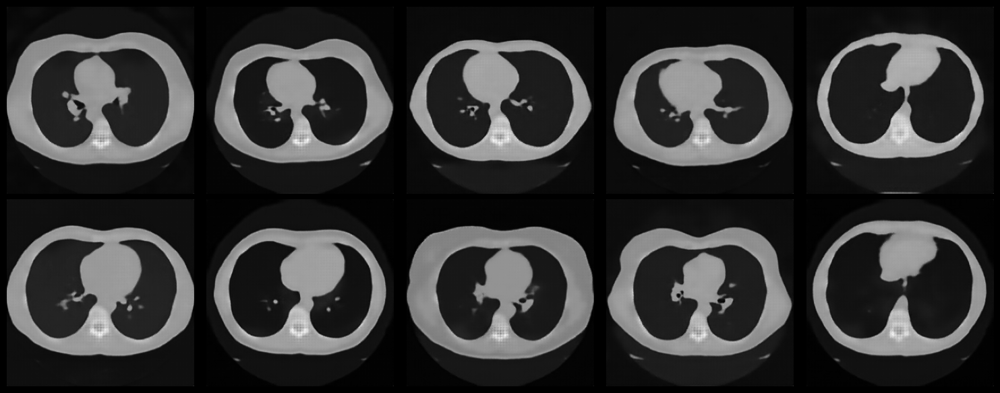

Epoch 62/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04988   grad_norm(encoder): 0.00235   grad_norm(decoder): 0.04327


Epoch 63/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04929   grad_norm(encoder): 0.00863   grad_norm(decoder): 0.01884


Epoch 64/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04920   grad_norm(encoder): 0.00462   grad_norm(decoder): 0.15112


Epoch 65/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04892   grad_norm(encoder): 0.00528   grad_norm(decoder): 0.01410


Epoch 66/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04855   grad_norm(encoder): 0.00446   grad_norm(decoder): 0.08177


Epoch 67/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04816   grad_norm(encoder): 0.00414   grad_norm(decoder): 0.07386


Epoch 68/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04832   grad_norm(encoder): 0.00561   grad_norm(decoder): 0.01773


Epoch 69/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04839   grad_norm(encoder): 0.00737   grad_norm(decoder): 0.03005


Epoch 70/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04816   grad_norm(encoder): 0.00316   grad_norm(decoder): 0.02016


Epoch 71/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04759   grad_norm(encoder): 0.00219   grad_norm(decoder): 0.13119


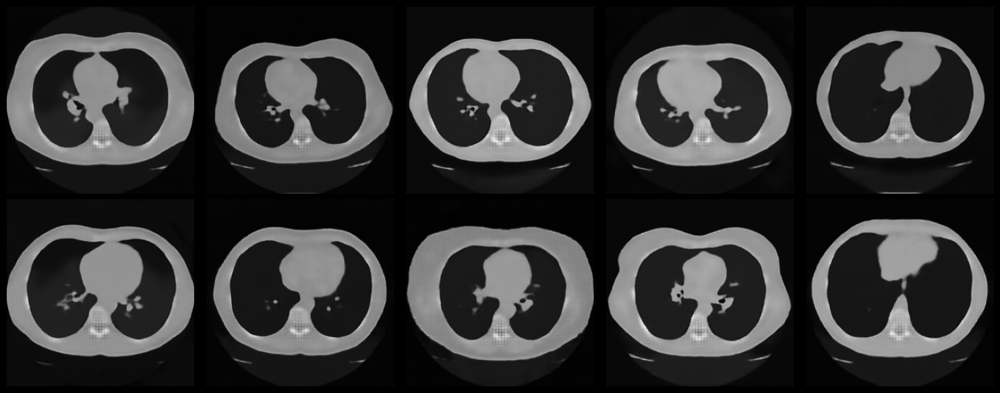

Epoch 72/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04740   grad_norm(encoder): 0.00366   grad_norm(decoder): 0.02694


Epoch 73/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04731   grad_norm(encoder): 0.00988   grad_norm(decoder): 0.02183


Epoch 74/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04727   grad_norm(encoder): 0.00662   grad_norm(decoder): 0.11641


Epoch 75/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04773   grad_norm(encoder): 0.00298   grad_norm(decoder): 0.04863


Epoch 76/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04730   grad_norm(encoder): 0.00348   grad_norm(decoder): 0.08561


Epoch 77/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04683   grad_norm(encoder): 0.00531   grad_norm(decoder): 0.12367


Epoch 78/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04646   grad_norm(encoder): 0.00455   grad_norm(decoder): 0.12335


Epoch 79/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04584   grad_norm(encoder): 0.00654   grad_norm(decoder): 0.02349


Epoch 80/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04639   grad_norm(encoder): 0.00515   grad_norm(decoder): 0.05710


Epoch 81/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04564   grad_norm(encoder): 0.00363   grad_norm(decoder): 0.12668


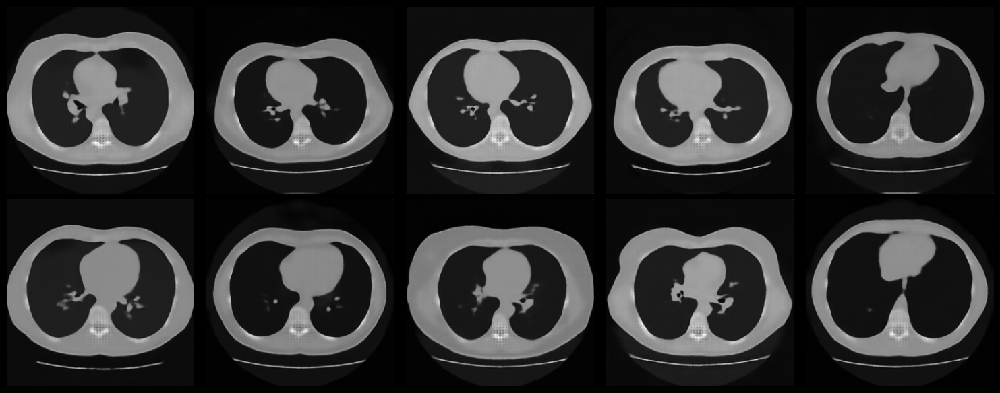

Epoch 82/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04486   grad_norm(encoder): 0.00180   grad_norm(decoder): 0.01557


Epoch 83/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04485   grad_norm(encoder): 0.00644   grad_norm(decoder): 0.08442


Epoch 84/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04472   grad_norm(encoder): 0.00313   grad_norm(decoder): 0.02010


Epoch 85/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04474   grad_norm(encoder): 0.00489   grad_norm(decoder): 0.02141


Epoch 86/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04428   grad_norm(encoder): 0.00602   grad_norm(decoder): 0.06697


Epoch 87/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04427   grad_norm(encoder): 0.00502   grad_norm(decoder): 0.02789


Epoch 88/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04410   grad_norm(encoder): 0.00824   grad_norm(decoder): 0.02525


Epoch 89/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04344   grad_norm(encoder): 0.00612   grad_norm(decoder): 0.04947


Epoch 90/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04319   grad_norm(encoder): 0.00405   grad_norm(decoder): 0.01718


Epoch 91/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04293   grad_norm(encoder): 0.00763   grad_norm(decoder): 0.01061


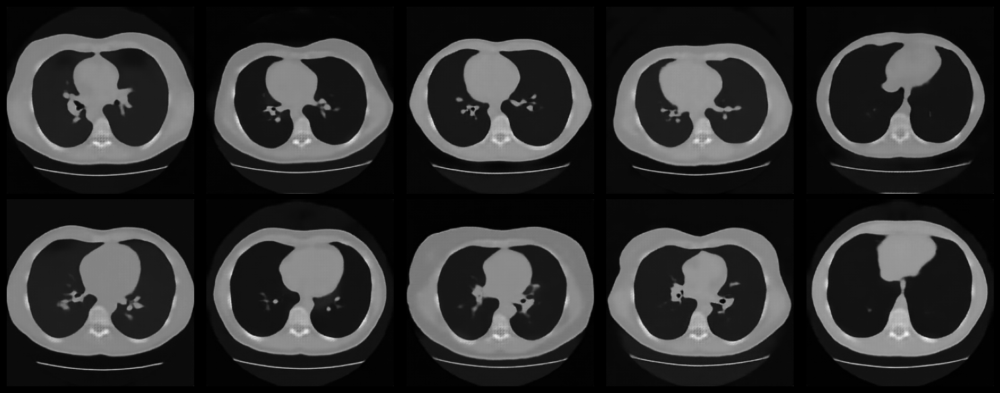

Epoch 92/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04346   grad_norm(encoder): 0.00389   grad_norm(decoder): 0.02325


Epoch 93/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04298   grad_norm(encoder): 0.00608   grad_norm(decoder): 0.01620


Epoch 94/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04286   grad_norm(encoder): 0.00702   grad_norm(decoder): 0.03400


Epoch 95/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04306   grad_norm(encoder): 0.00595   grad_norm(decoder): 0.03372


Epoch 96/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04237   grad_norm(encoder): 0.00297   grad_norm(decoder): 0.05196


Epoch 97/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04222   grad_norm(encoder): 0.00388   grad_norm(decoder): 0.26782


Epoch 98/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04284   grad_norm(encoder): 0.00392   grad_norm(decoder): 0.05618


Epoch 99/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04255   grad_norm(encoder): 0.00377   grad_norm(decoder): 0.09591


Epoch 100/100:   0%|          | 0/79 [00:00<?, ?it/s]

Loss: 0.04220   grad_norm(encoder): 0.00243   grad_norm(decoder): 0.00881


In [29]:
history = []
display_interval = 10

for epoch in range(epochs):
  auto_encoder.train()

  running_loss = 0.0
  pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")
  for images in pbar:
    images = images.to(device)

    optimizer.zero_grad()
    reconstucted = auto_encoder(images)
    loss = criterion(reconstucted, images)
    loss.backward()
    optimizer.step()

    running_loss += loss.item() * images.size(0)
  history.append(running_loss/len(dataloader.dataset))
  grad_norm_encoder = debug_grad_norm(auto_encoder.module.encoder)
  grad_norm_decoder = debug_grad_norm(auto_encoder.module.decoder)

  print_val =  f"{clrd('Loss:', 'special')} {history[-1]:.5f}   "
  print_val += f"{clrd('grad_norm(encoder):', 'ok')} {grad_norm_encoder:.5f}   "
  print_val += f"{clrd('grad_norm(decoder):', 'ok')} {grad_norm_decoder:.5f}"
  print(print_val)


  if epoch%display_interval==0:
      auto_encoder.eval()
      with torch.no_grad():
        reconstucted = auto_encoder(sample_img_batch)
        show_tensor_images(reconstucted, 2, 5)

  if DEBUG:
      break

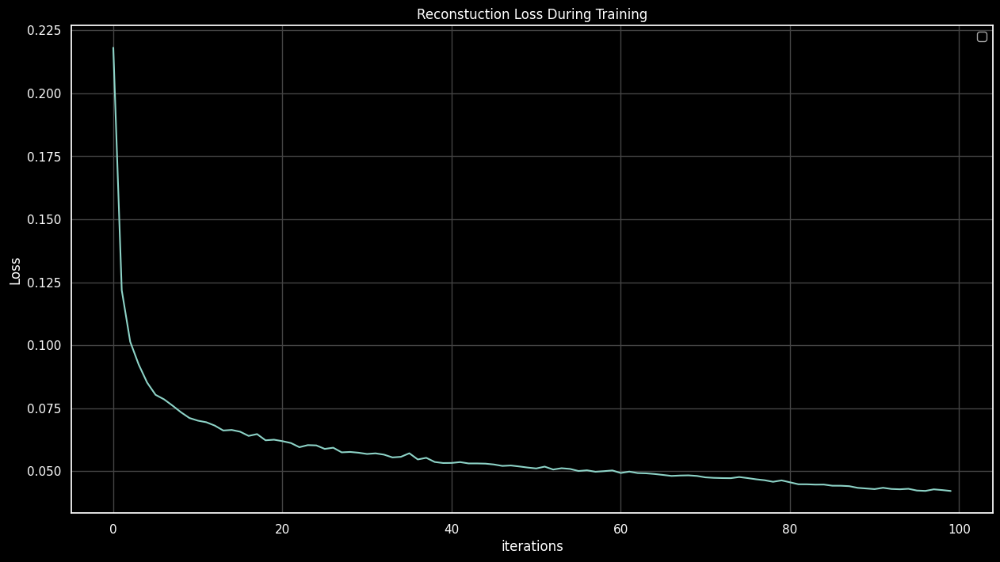

In [30]:
plt.figure(figsize=(15,8))
plt.title("Reconstuction Loss During Training")
plt.plot(history)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [31]:
torch.save(auto_encoder.state_dict(), os.path.join(save_dir, f"auto_encoder_9_5_25.pt"))